In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv

In [2]:
def show(img):
    if img.ndim == 2:
        plt.imshow(img, cmap='gray')
    else:
        plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.show()

# 图像边缘提取
# 1.Premitt算子
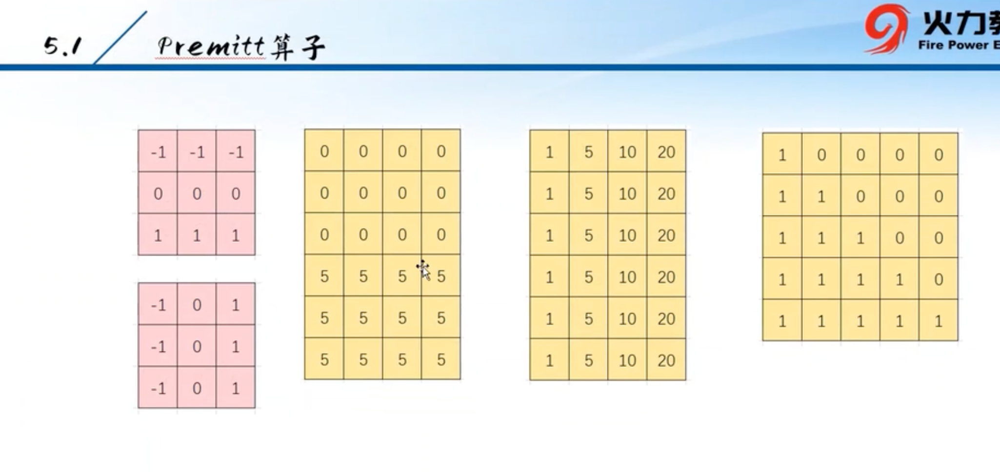
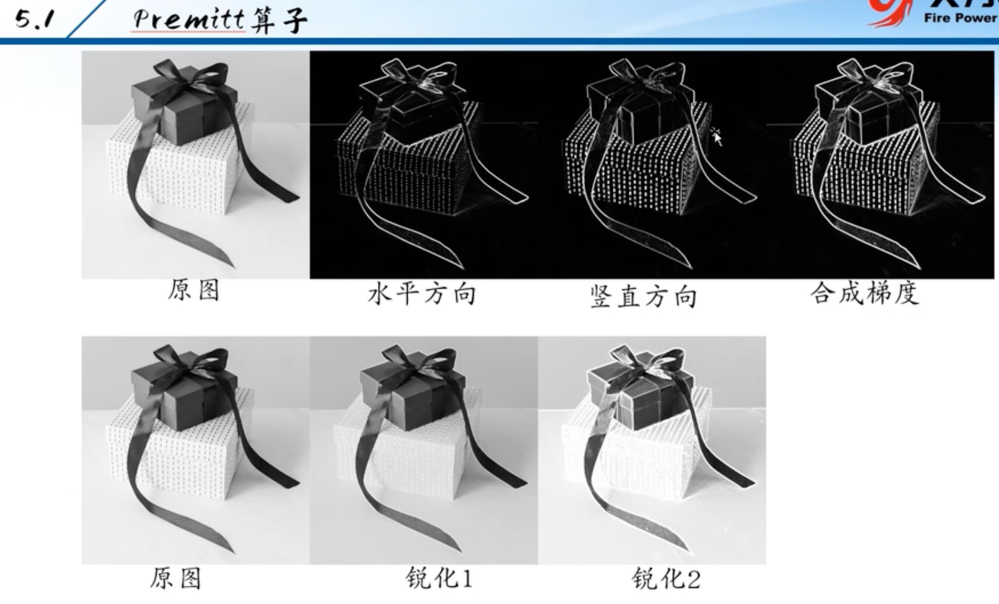
- 锐化：原图+边缘

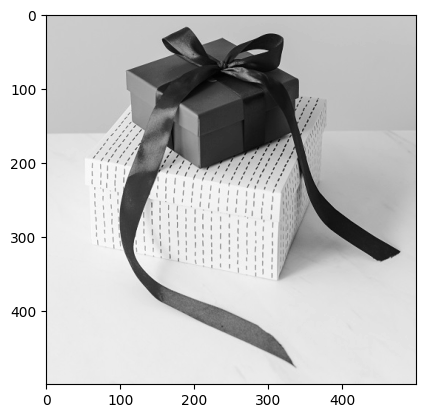

In [4]:
img = cv.imread('pic/gift500x500.jpg', 0)
show(img)

In [5]:
ky = np.array([[-1,-1,-1],[0,0,0],[1,1,1]])
kx = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])

imgX = cv.filter2D(img,cv.CV_64F,kx)
imgY = cv.filter2D(img,cv.CV_64F,ky)

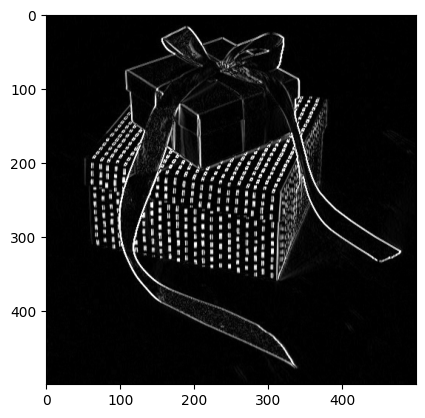

In [8]:
show(np.abs(imgX).clip(0,255))

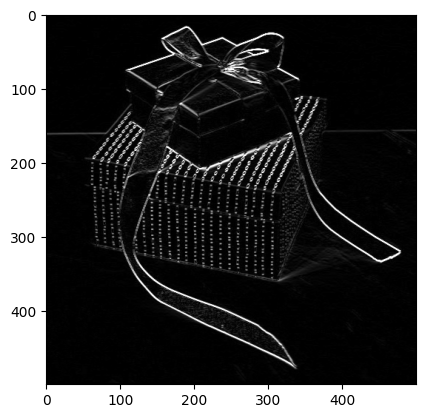

In [9]:
show(np.abs(imgY).clip(0,255))

In [10]:
#梯度合成
imgXY = np.sqrt(imgX**2+imgY**2)
imgXY2 = np.abs(imgX)+np.abs(imgY)

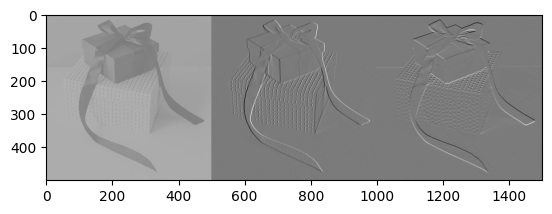

In [13]:
show(np.hstack([img,imgX,imgY]))

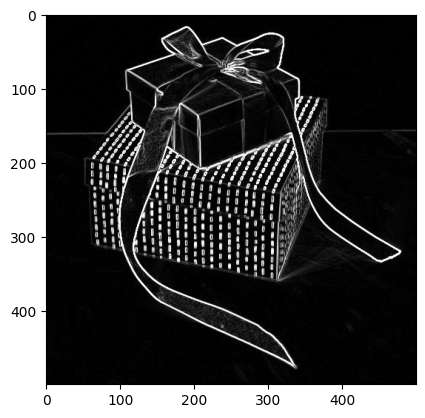

In [18]:
show(imgXY.clip(0,255))

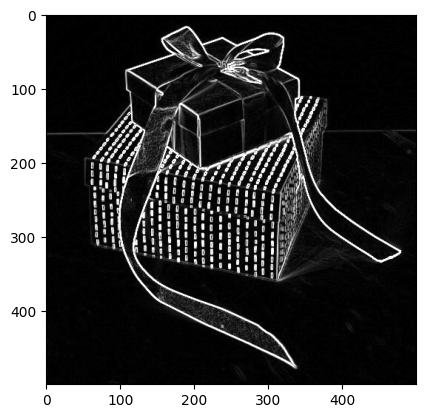

In [20]:
show(imgXY2.clip(0,255))

# 2.Roberts算子
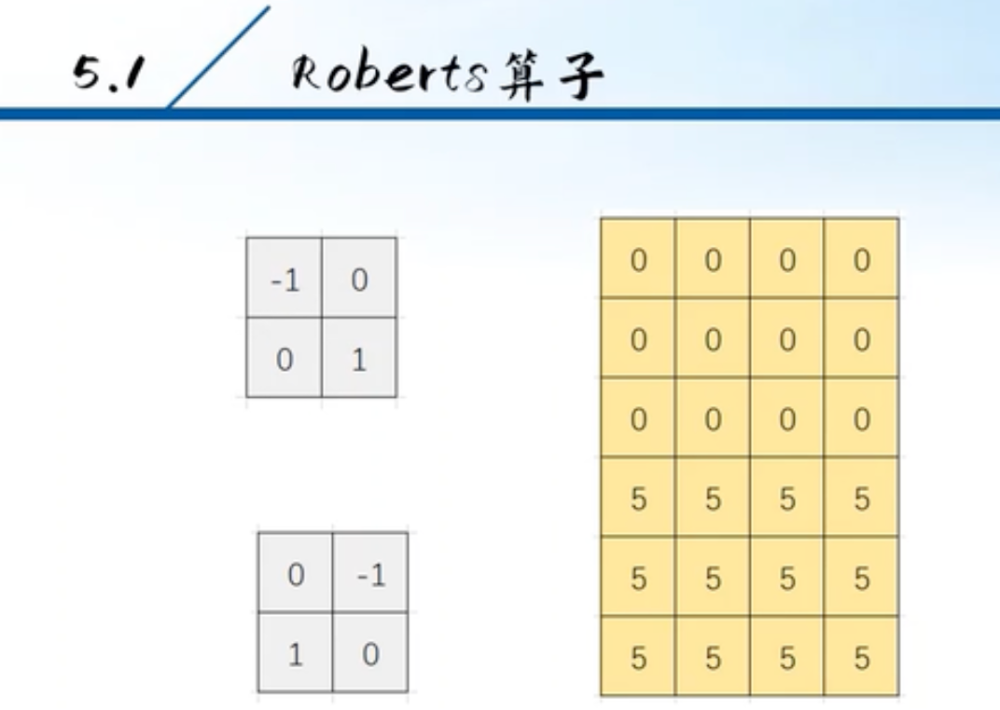

In [21]:
ky = np.array([[0,-1],[1,0]])
kx = np.array([[-1,0],[0,1]])

imgX = cv.filter2D(img,cv.CV_64F,kx)
imgY = cv.filter2D(img,cv.CV_64F,ky)

In [22]:
#梯度合成
imgXY = np.sqrt(imgX**2+imgY**2)
imgXY2 = np.abs(imgX)+np.abs(imgY)

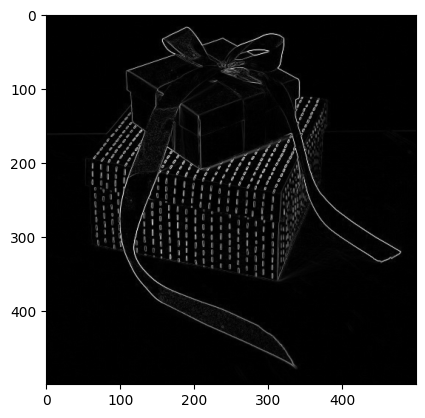

In [24]:
show(imgXY.clip(0,255))

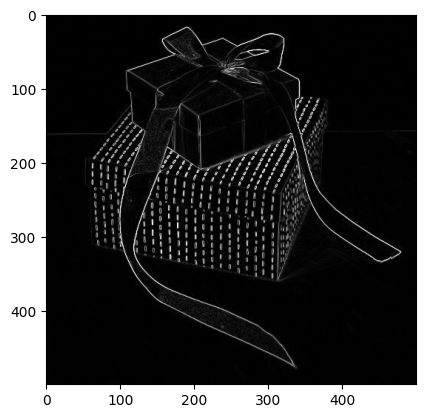

In [23]:
show(imgXY2.clip(0,255))

# 3.Sobel-Feldman算子
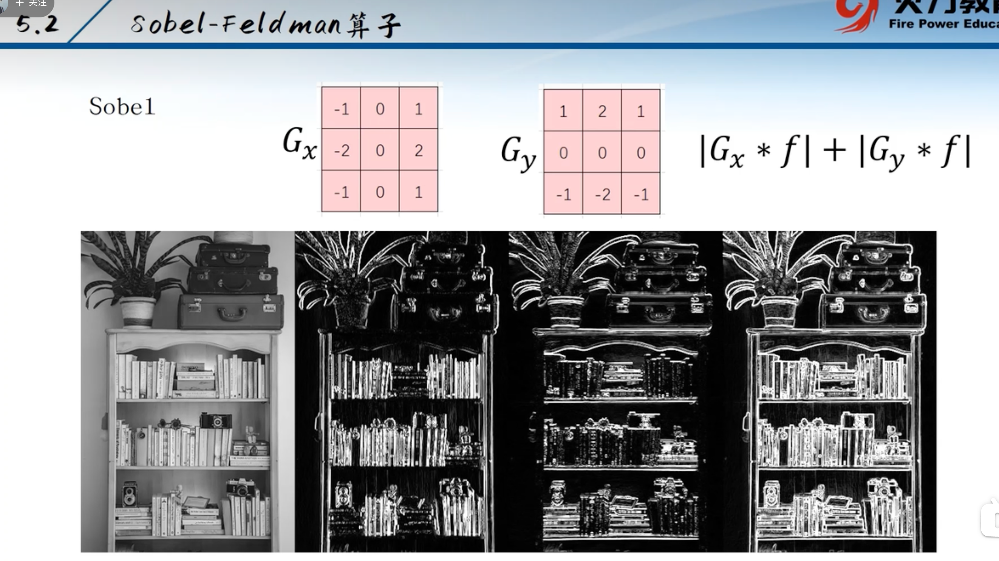

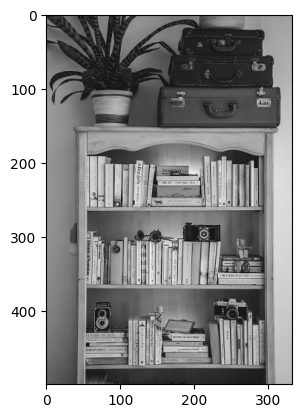

In [26]:
img = cv.imread("pic/bookshelf500x333.jpg",0)
show(img)

In [30]:
imgX = cv.Sobel(img,cv.CV_16S,1,0)
imgY = cv.Sobel(img,cv.CV_16S,0,1)

imgXY = np.abs(imgX)+np.abs(imgY)

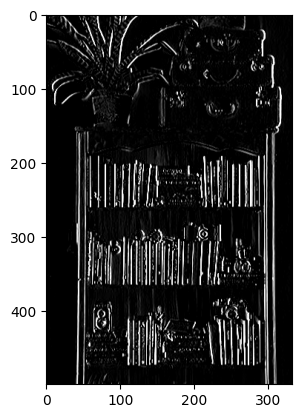

In [31]:
show(imgX.clip(0,255))

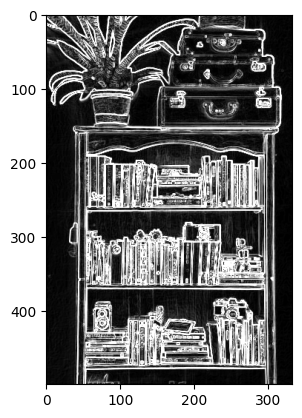

In [32]:
show(imgXY.clip(0,255))

# 4.Scharr算子
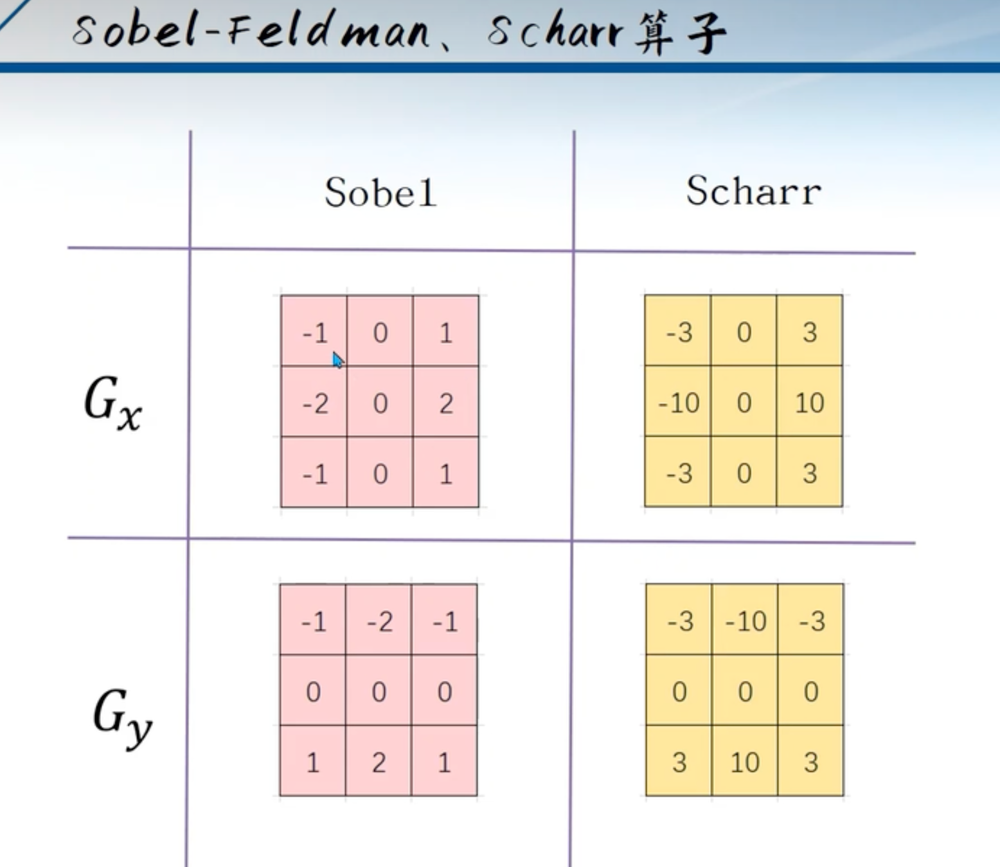

In [33]:
imgX = cv.Scharr(img,cv.CV_16S,1,0)
imgY = cv.Scharr(img,cv.CV_16S,0,1)

imgXY = np.abs(imgX)+np.abs(imgY)

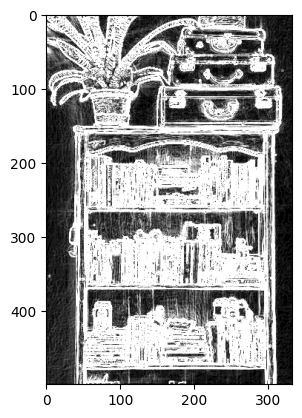

In [34]:
show(imgXY.clip(0,255))

# 5.Laplician算子 LoG算子

Log算子相当于图像经过高斯模糊后，再过Laplician算子

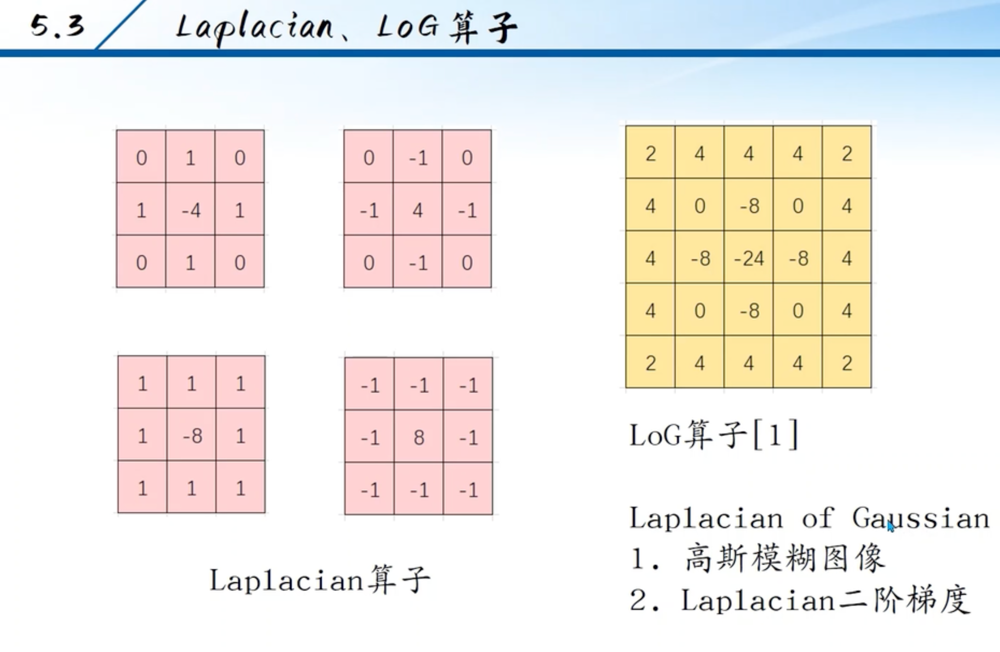
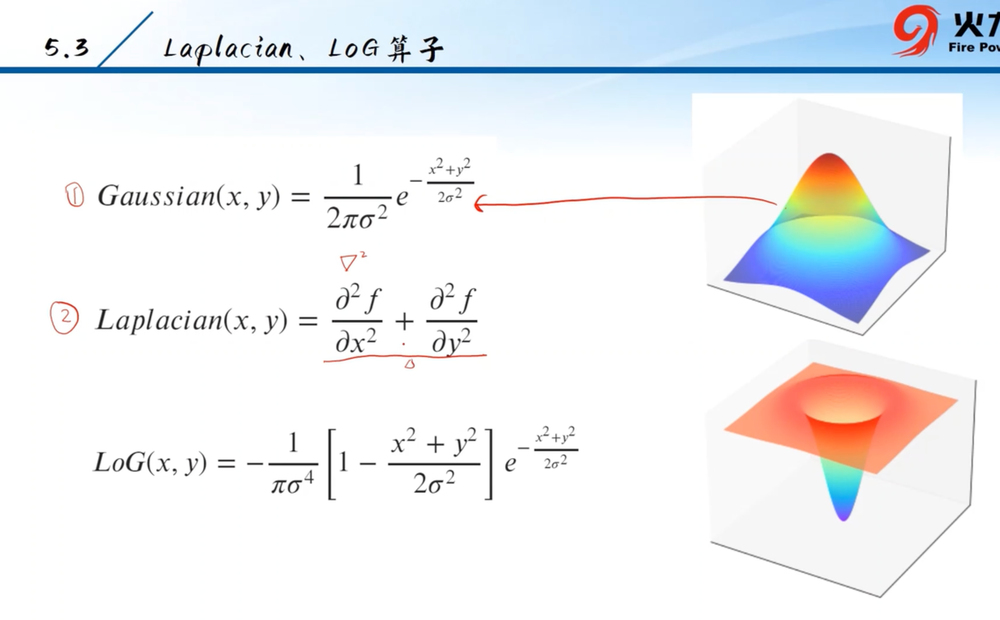

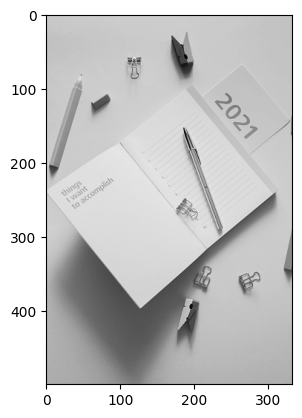

In [36]:
img = cv.imread("pic/notebook500x333.jpg",0)
show(img)

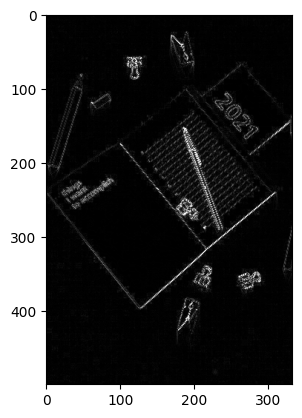

In [39]:
#laplacian算子
img_lap = cv.Laplacian(img,cv.CV_16S)
show(np.abs(img_lap).clip(0,255))

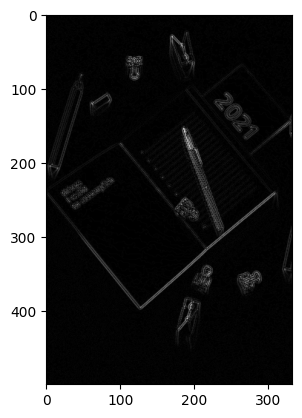

True

In [43]:
#log算子
img_blur = cv.GaussianBlur(img,(3,3),sigmaX=1)
img_log = cv.Laplacian(img_blur,cv.CV_16S)
show(np.abs(img_log).clip(0,255))
cv.imwrite('pic/test/notebook_log.png',img_log)

# 6.Canny算子
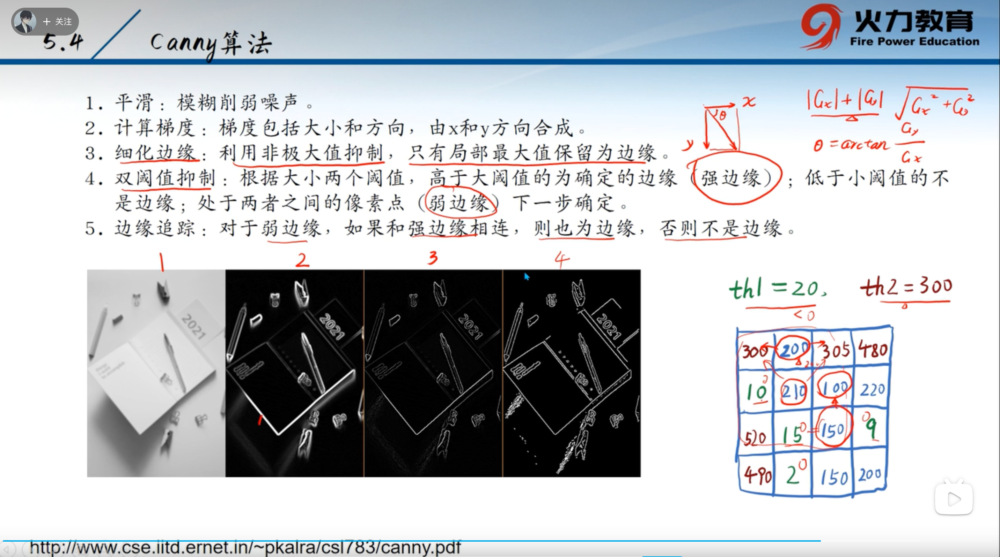
- 总结
    - 如果＜小阈值，则不是边缘，置为0
    - 如果>大阈值，则为边缘，且为强边缘
    - 如果处于两个阈值之间，则为弱边缘，若该像素点的邻域内有强边缘，则该像素点为边缘

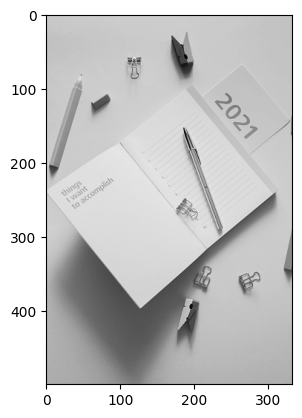

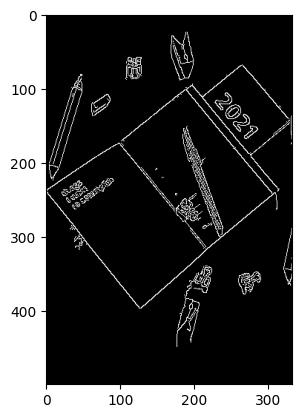

In [46]:
img_edge = cv.Canny(img,20,200)
show(img)
show(img_edge)

# 7.Canny算子编程实现
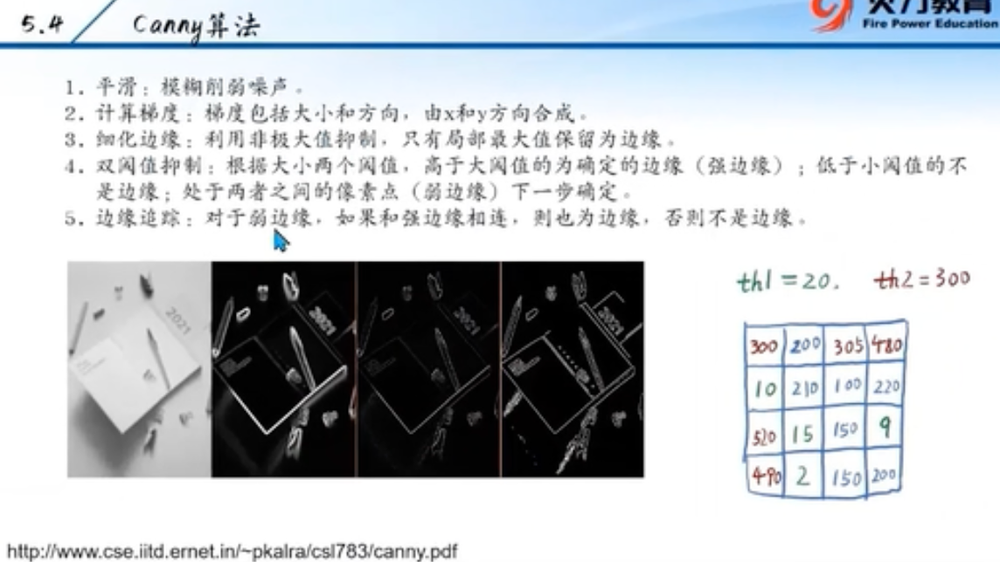
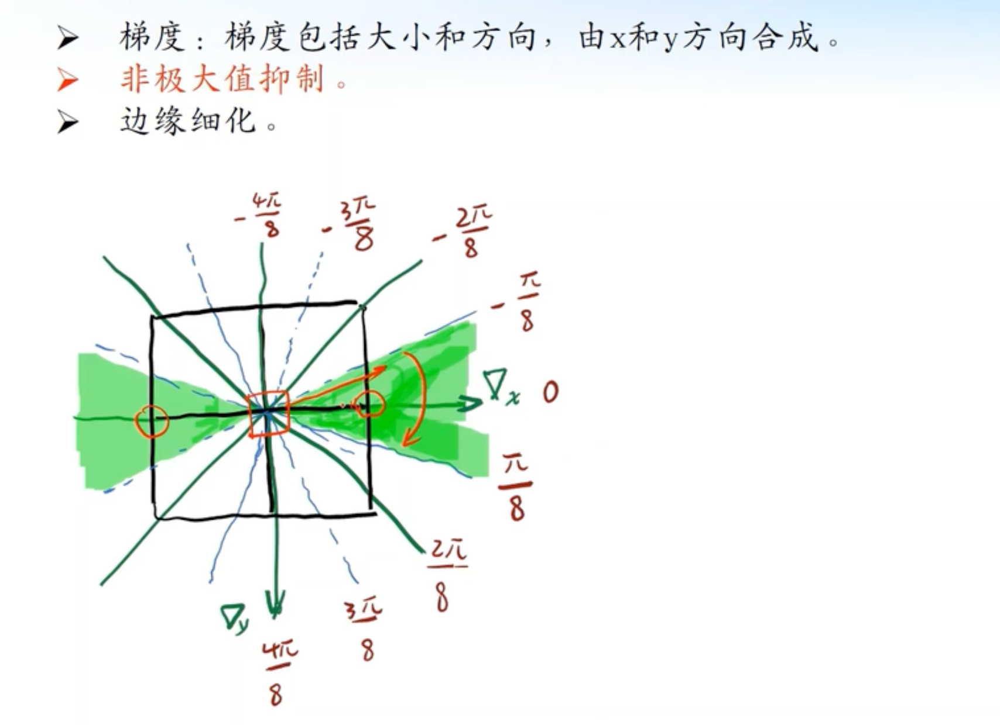

In [56]:
img = cv.imread('pic/notebook500x333.jpg', 0)

# 1. 平滑
img_blur = cv.GaussianBlur(img, (5,5), 2)

# 2. 计算梯度
gradx = cv.Sobel(img_blur, cv.CV_64F, 1, 0)
grady = cv.Sobel(img_blur, cv.CV_64F, 0, 1)
R = np.abs(gradx) + np.abs(grady)
T = np.arctan(grady / (gradx + 1e-3))

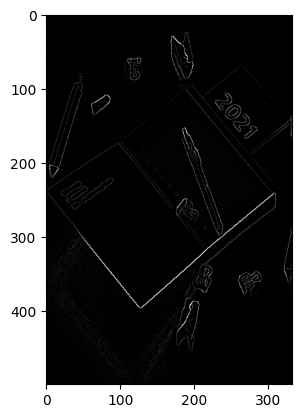

In [57]:
# 3. 细化边缘
h, w = R.shape
img_thin = np.zeros_like(R)

for i in range(1, h-1):
    for j in range(1, w-1):
        theta = T[i,j]
        if -np.pi / 8 <= theta < np.pi / 8:
            if R[i,j] == max([R[i,j], R[i,j-1], R[i, j+1]]):
                img_thin[i,j] = R[i,j]
        elif -3 * np.pi / 8 <= theta < -np.pi / 8:
            if R[i,j] == max([R[i,j], R[i-1,j+1], R[i+1,j-1]]):
                img_thin[i,j] = R[i,j]
        elif np.pi / 8 <= theta < 3 * np.pi / 8:
            if R[i,j] == max([R[i,j], R[i-1,j-1], R[i+1,j+1]]):
                img_thin[i,j] = R[i,j]      
        else:
            if R[i,j] == max([R[i,j], R[i-1,j], R[i+1,j]]):
                img_thin[i,j] = R[i,j]
                
show(img_thin)

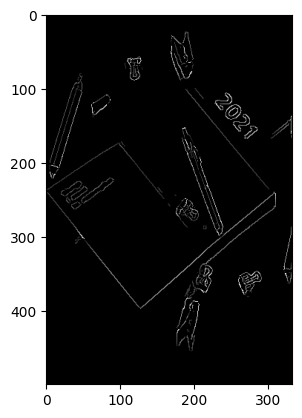

In [58]:
th1 = 5
th2 = 50

h, w = img_thin.shape
img_edge = np.zeros_like(img_thin, dtype=np.uint8)

for i in range(1, h-1):
    for j in range(1, w-1):
        if img_thin[i,j] >= th2:
            img_edge[i,j] = img_thin[i,j]
        elif img_thin[i,j] > th1:
            around = img_thin[i-1:i+2, j-1:j+2] #取左边一个点，右边一个点，以及自己
            if around.max() >= th2:
                img_edge[i,j] = img_thin[i,j]
                
show(img_edge)